In [56]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import pathlib

In [57]:
data_dir = pathlib.Path('./dataset/')
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

300


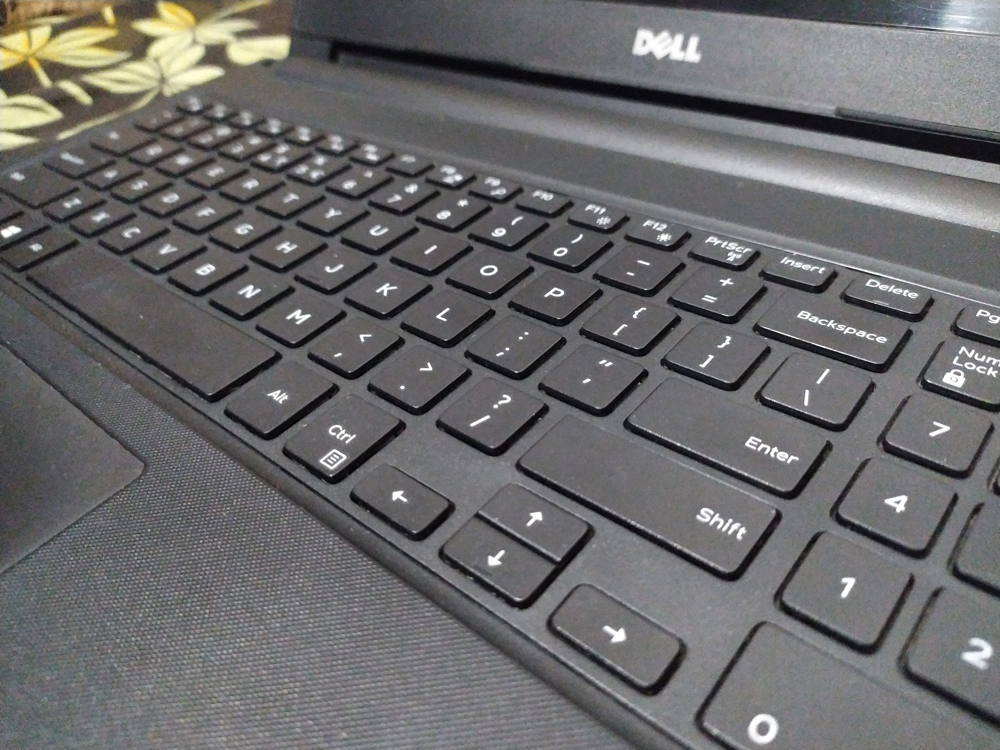

In [58]:
ewaste = list(data_dir.glob('ewaste/*'))
PIL.Image.open(str(ewaste[0]))

In [59]:
batch_size = 32
img_height = 180
img_width = 180

In [60]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 300 files belonging to 2 classes.
Using 240 files for training.


In [61]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 300 files belonging to 2 classes.
Using 60 files for validation.


In [62]:
class_names = train_ds.class_names
print(class_names)

['ewaste', 'not_ewaste']


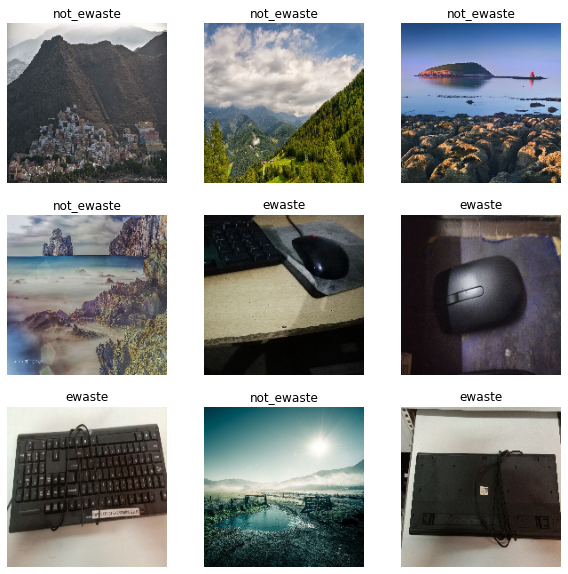

In [63]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [64]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(32, 180, 180, 3)
(32,)


In [65]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [66]:
normalization_layer = layers.Rescaling(1./255)

In [67]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 0.99469066


In [68]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [69]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [70]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_6 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 45, 45, 64)       

In [71]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
8/8 [==============================] - 4s 467ms/step - loss: 1.5258 - accuracy: 0.4292 - val_loss: 0.6782 - val_accuracy: 0.6167
Epoch 2/10
8/8 [==============================] - 3s 349ms/step - loss: 0.6280 - accuracy: 0.6792 - val_loss: 0.5972 - val_accuracy: 0.6500
Epoch 3/10
8/8 [==============================] - 3s 418ms/step - loss: 0.5424 - accuracy: 0.6708 - val_loss: 0.4892 - val_accuracy: 0.6667
Epoch 4/10
8/8 [==============================] - 3s 354ms/step - loss: 0.3912 - accuracy: 0.8083 - val_loss: 0.4579 - val_accuracy: 0.7000
Epoch 5/10
8/8 [==============================] - 3s 429ms/step - loss: 0.2672 - accuracy: 0.8792 - val_loss: 0.3882 - val_accuracy: 0.7333
Epoch 6/10
8/8 [==============================] - 3s 403ms/step - loss: 0.2938 - accuracy: 0.8750 - val_loss: 0.3358 - val_accuracy: 0.8833
Epoch 7/10
8/8 [==============================] - 3s 373ms/step - loss: 0.1916 - accuracy: 0.9375 - val_loss: 0.2231 - val_accuracy: 0.9333
Epoch 8/10
8/8 [====

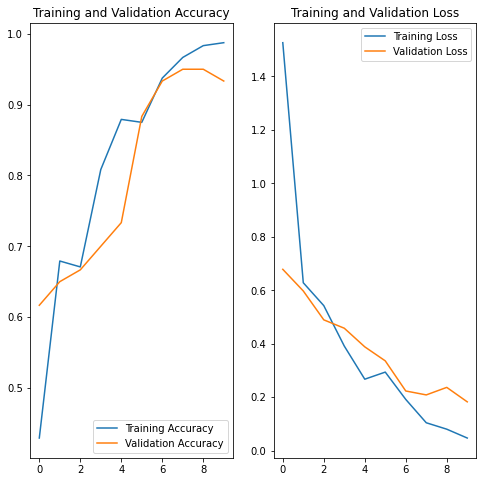

In [72]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [73]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

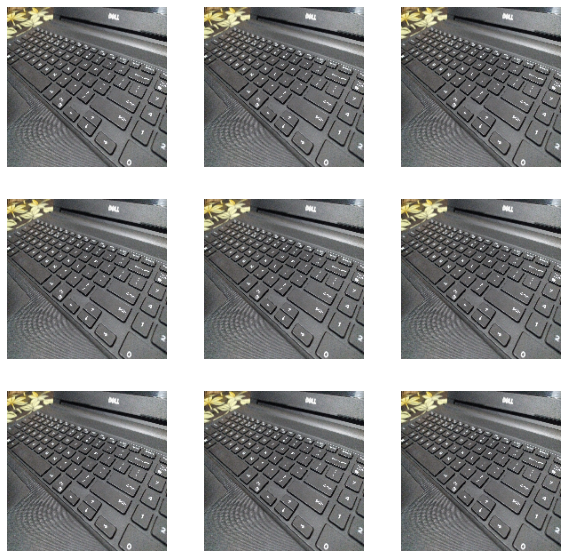

In [74]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [75]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [76]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [77]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_5 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_7 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                 

In [78]:
epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
8/8 [==============================] - 5s 470ms/step - loss: 1.7251 - accuracy: 0.4458 - val_loss: 0.6221 - val_accuracy: 0.6500
Epoch 2/15
8/8 [==============================] - 4s 479ms/step - loss: 0.5981 - accuracy: 0.6708 - val_loss: 0.5743 - val_accuracy: 0.6500
Epoch 3/15
8/8 [==============================] - 4s 479ms/step - loss: 0.5364 - accuracy: 0.6708 - val_loss: 0.4266 - val_accuracy: 0.7500
Epoch 4/15
8/8 [==============================] - 4s 467ms/step - loss: 0.4374 - accuracy: 0.7542 - val_loss: 0.3309 - val_accuracy: 0.8333
Epoch 5/15
8/8 [==============================] - 4s 516ms/step - loss: 0.3324 - accuracy: 0.8625 - val_loss: 0.3199 - val_accuracy: 0.8167
Epoch 6/15
8/8 [==============================] - 4s 484ms/step - loss: 0.3134 - accuracy: 0.8583 - val_loss: 0.3752 - val_accuracy: 0.8500
Epoch 7/15
8/8 [==============================] - 4s 471ms/step - loss: 0.2925 - accuracy: 0.8667 - val_loss: 0.2153 - val_accuracy: 0.9000
Epoch 8/15
8/8 [====

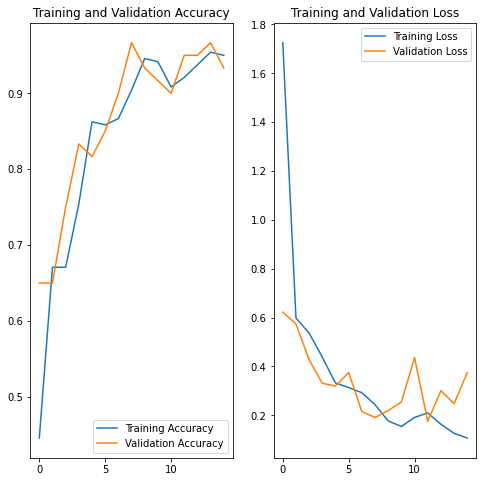

In [79]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [83]:
img = tf.keras.utils.load_img(
    "./test/new1.jpeg", target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
print(predictions)
print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

1/1 [==============================] - 0s 19ms/step
[[-2.2464933  -0.06033786]]
This image most likely belongs to not_ewaste with a 89.90 percent confidence.
